# Data Exploration and Visualization

In this step, we will examine the dataset to find important details like how the data is spread out and displayed in a histogram.

In [10]:
import os

ROOT_DIR = os.path.dirname(os.path.abspath(''))
DATA_DIR = os.path.join(ROOT_DIR, 'data/food-101-tiny')

## Data Analysis

Since we are working on a classification task, the dataset only provides labels for the entire image, without additional information like bounding boxes or segmentation masks.

**Note:** The dataset is already organized, so there is no need to restructure the dataset.

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

class_names = [
    'apple_pie',
    'bibimbap',
    'cannoli',
    'edamame',
    'falafel',
    'french_toast',
    'ice_cream',
    'ramen',
    'sushi',
    'tiramisu'
]

### Class Distribution

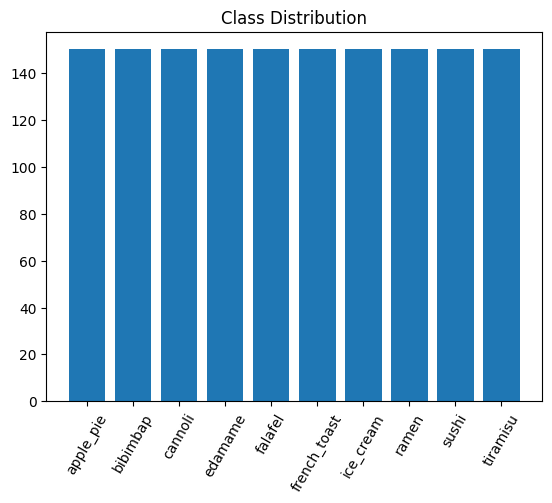

In [14]:
train_data_path = os.path.join(DATA_DIR, 'train')
train_split_count = {name:0 for name in class_names}

for name in train_split_count.keys():
    train_split_count[name] = len(os.listdir(os.path.join(train_data_path, name)))

plt.bar(range(len(train_split_count)), list(train_split_count.values()), align='center')
plt.title("Class Distribution")
plt.xticks(range(len(train_split_count)), list(train_split_count.keys()), rotation = 60)
plt.show()


### Color Distribution Statistics

Normalizing the input RGB image is important for training deep learning models because **it helps to standardize** and **stabilize the input data**.
- By scaling the pixel values to a consistent range, such as between 0 and 1 or -1 and 1, normalization ensures that the model receives inputs with similar magnitudes.
- Helps the optimization algorithms to converge faster and more reliably, leading to improved training speed and model performance.
- Create a baseline representation of the dataset's color distribution. By comparing the current mean and std values with the baseline values, we can detect if the data has drifted.

The pixel standardization is supported at two levels: either per-image (called **sample-wise**) or per-dataset (called **feature-wise**). The values can be calculated from the pixel values in each image only (sample-wise) or across the entire training dataset (feature-wise).

In [31]:
train_split_images_path = []

for name in class_names:
    list_files = os.listdir(os.path.join(train_data_path, name))
    list_files = [os.path.join(train_data_path, name, file) for file in list_files]
    train_split_images_path+=list_files

rgb_mean = np.zeros(3)
rgb_std = np.zeros(3)
rgb_median = np.zeros(3)
for file in train_split_images_path:
    img = cv2.imread(file)
    image_size = img.shape[:2]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img / 255.0
    rgb_median += np.median(img, axis=(0, 1))
    rgb_mean += np.mean(img, axis=(0, 1))
    rgb_std += np.std(img, axis=(0, 1))

train_rgb_median = rgb_median / len(train_split_images_path)
train_rgb_mean = rgb_mean / len(train_split_images_path)
train_rgb_std = rgb_std / len(train_split_images_path)
print(f'size: {image_size}')
print(f'median: {train_rgb_median}')
print(f'mean: {train_rgb_mean}')
print(f'std: {train_rgb_std}')

size: (384, 512)
median: [0.52068235 0.41877124 0.28893595]
mean: [0.51462304 0.43454864 0.33441313]
std: [0.24198696 0.24747032 0.23758201]


**Note:** that since we only have to splits, we assume that **train split is the seen data**, and **validation is the unseen data**. So we only need to compute the statistics for train set.

#### Resized Dataset

In the previous section, we calculated the dataset's statistics based on its original sizes, which could be different for each image. However, we encountered a problem because the model needs the images to have a specific size, which can be smaller or larger than the original image.

To make sure that the input image has the same size as the model expects, we have to apply a resizing operation to the image. **Resizing the image will distort the pixels** and risking to **remove small but important spatial information** from the image.

When we resize an image, **the color distribution of the image also changes**. As a result, we need to recalculate the color distribution statistics using the resized image. This new set of statistics becomes our updated baseline because it makes more sense to use the statistics of the resized image since it will be the input to the model.

Let's recompute and compare it with the previous section.

In [35]:
print(f'Original Median: {train_rgb_median} mean: {train_rgb_mean} std: {train_rgb_std}')

for size in [224, 384]:
    rgb_mean = np.zeros(3)
    rgb_std = np.zeros(3)
    rgb_median = np.zeros(3)
    for file in train_split_images_path:
        img = cv2.imread(file)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (size, size))
        img = img / 255.0
        rgb_median += np.median(img, axis=(0, 1))
        rgb_mean += np.mean(img, axis=(0, 1))
        rgb_std += np.std(img, axis=(0, 1))

    rgb_median /= len(train_split_images_path)
    rgb_mean /= len(train_split_images_path)
    rgb_std /= len(train_split_images_path)
    print(f'{size} Median: {rgb_median} mean: {rgb_mean} std: {rgb_std}')

Original Median: [0.52068235 0.41877124 0.28893595] mean: [0.51462304 0.43454864 0.33441313] std: [0.24198696 0.24747032 0.23758201]
224 Median: [0.52029542 0.41839869 0.28850719] mean: [0.51420346 0.43412702 0.33399528] std: [0.2408595  0.24633563 0.23637417]
384 Median: [0.5205451  0.41864052 0.28871111] mean: [0.51442681 0.43435301 0.33421855] std: [0.24099932 0.246478   0.23652802]


As you can see from the result, it produces a **slightly different values** from the baseline. Depends on the number of fractional digits, **it can be a big difference** to the baseline values.

This is just an example with different sizes, what if we change the resizing method to `Nearest`, `Area`, `Cubic`, or `LANCZOS4`? It may produce different values.

### Validation Set

Since we don't have a test set, we assume the validation set is the unseen data which is the test data. There is no need to compute the statistics but we'll do it anyway.  

### Class Distribution

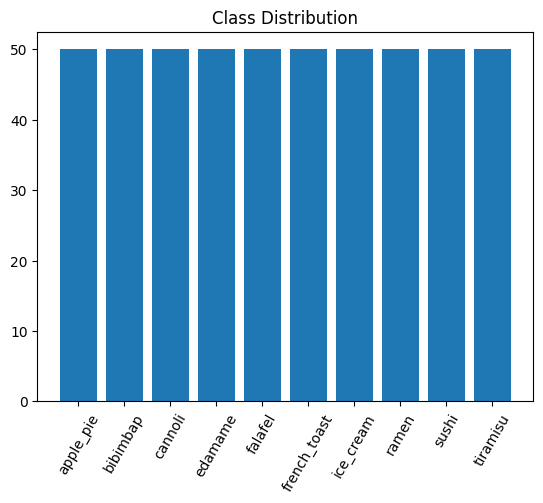

In [36]:
val_data_path = os.path.join(DATA_DIR, 'valid')
val_split_count = {name:0 for name in class_names}

for name in val_split_count.keys():
    val_split_count[name] = len(os.listdir(os.path.join(val_data_path, name)))

plt.bar(range(len(val_split_count)), list(val_split_count.values()), align='center')
plt.title("Class Distribution")
plt.xticks(range(len(val_split_count)), list(val_split_count.keys()), rotation = 60)
plt.show()


In [37]:
val_split_images_path = []

for name in class_names:
    list_files = os.listdir(os.path.join(val_data_path, name))
    list_files = [os.path.join(val_data_path, name, file) for file in list_files]
    val_split_images_path+=list_files

rgb_mean = np.zeros(3)
rgb_std = np.zeros(3)
rgb_median = np.zeros(3)
for file in val_split_images_path:
    img = cv2.imread(file)
    image_size = img.shape[:2]
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img / 255.0
    rgb_median += np.median(img, axis=(0, 1))
    rgb_mean += np.mean(img, axis=(0, 1))
    rgb_std += np.std(img, axis=(0, 1))

val_rgb_median = rgb_median / len(val_split_images_path)
val_rgb_mean = rgb_mean / len(val_split_images_path)
val_rgb_std = rgb_std / len(val_split_images_path)
print(f'size: {image_size}')
print(f'median: {val_rgb_median}')
print(f'mean: {val_rgb_mean}')
print(f'std: {val_rgb_std}')

size: (512, 512)
median: [0.53072941 0.42506667 0.29146275]
mean: [0.51902016 0.43645223 0.33702133]
std: [0.24045572 0.2467659  0.24344718]


## Data Visualization

To better understand about our data, we need to visualize some of the dataset.

IndexError: list index out of range

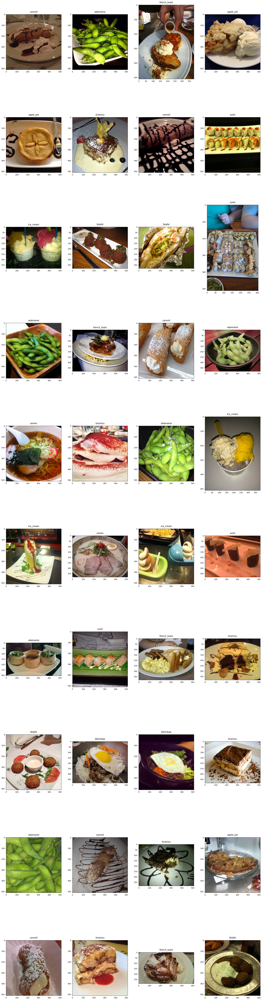

In [48]:
import random

rows = 10
cols = 4
fig, axs = plt.subplots(rows, cols, figsize=(25,100))
axs = axs.ravel().tolist()

list_of_samples = random.choices(train_split_images_path, k=rows*cols)
random.shuffle(train_split_images_path)

for idx, file_path in enumerate(train_split_images_path):
    img = cv2.imread(file_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    class_name = file_path.split('/')[-2]
    axs[idx].imshow(img)
    axs[idx].set_title(class_name, pad = 10)

fig.suptitle("Image from each class", y=1.05, fontsize=30)
plt.setp(axs, xticks=[],yticks=[])
plt.tight_layout()